In [27]:
import geopandas
import matplotlib.pyplot as plt
import contextily as cx
import pandas
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')
geopandas.options.io_engine = "pyogrio"
%matplotlib inline

In [28]:
from config import PostgresReadOnlyConfig, PostgresReadWriteConfig
from sqlalchemy import create_engine

query = """
    select
             s."OBJECTID",
             s."Shape" as geometry,
             s.compname as soil_name, 
             s.taxclname as soil_taxonomy, 
             s.hydgrpdcd as hydrologic_group, 
             s.earthcovki as earth_cover, 
             s.runoff as runoff_class, 
             s.forpehrtdc as potential_erosion_hazard, 
             s.drclassdcd as drainage_class_dominant, 
             s.drclasswet as drainage_class_wettest, 
             s.reannualpr as annual_precipitation, 
             s.flodfreqdc as flood_prob_annual 
    FROM staging."SoilTypes_TC" as s
     WHERE s.compname <> 'Water' and s.compname <> 'Alluvial land'
"""
conn_str = PostgresReadWriteConfig().__str__()
engine = create_engine(conn_str)
soils = geopandas.read_postgis(sql=query, con=engine, geom_col='geometry', crs="EPSG:26914")
soils

,OBJECTID,geometry,soil_name,soil_taxonomy,hydrologic_group,earth_cover,runoff_class,potential_erosion_hazard,drainage_class_dominant,drainage_class_wettest,annual_precipitation,flood_prob_annual
0,1,"MULTIPOLYGON (((585579.569 3369127.427, 585574...",Brackett,"Loamy, carbonatic, thermic, shallow Typic Hapl...",D,Grass/herbaceous cover,High,Severe,Well drained,Well drained,0,None
1,2,"MULTIPOLYGON (((584624.758 3374124.418, 584793...",Heaton,"Loamy, siliceous, semiactive, thermic Arenic P...",B,Grass/herbaceous cover,Very low,Slight,Well drained,Well drained,0,None
2,3,"MULTIPOLYGON (((584793.826 3374487.018, 585011...",Eckrant,"Clayey-skeletal, smectitic, thermic Lithic Hap...",D,Grass/herbaceous cover,Medium,Slight,Well drained,Well drained,0,None
3,4,"MULTIPOLYGON (((586576.736 3374321.548, 586576...",Heaton,"Loamy, siliceous, semiactive, thermic Arenic P...",B,Grass/herbaceous cover,Very low,Slight,Well drained,Well drained,0,None
4,5,"MULTIPOLYGON (((584439.235 3372851.219, 584425...",Eckrant,"Clayey-skeletal, smectitic, thermic Lithic Hap...",D,Grass/herbaceous cover,High,Moderate,Well drained,Well drained,0,None
...,...,...,...,...,...,...,...,...,...,...,...,...
7493,7595,"MULTIPOLYGON (((628338.081 3325948.127, 628334...",Heiden,"Fine, smectitic, thermic Udic Haplusterts",D,Grass/herbaceous cover,Very high,Moderate,Well drained,Well drained,0,None
7494,7596,"MULTIPOLYGON (((627436.151 3325017.550, 627424...",Wilson,"Fine, smectitic, thermic Oxyaquic Vertic Haplu...",D,Shrub cover,Very high,Slight,Moderately well drained,Moderately well drained,0,None
7495,7597,"MULTIPOLYGON (((629777.313 3327437.424, 629781...",Wilson,"Fine, smectitic, thermic Oxyaquic Vertic Haplu...",D,Shrub cover,Very high,Slight,Moderately well drained,Moderately well drained,0,None
7496,7598,"MULTIPOLYGON (((627060.766 3324630.728, 627041...",Houston Black,"Fine, smectitic, thermic Udic Haplusterts",D,Crop cover,Very high,Slight,Moderately well drained,Moderately well drained,0,None


In [29]:
query = """
select * from public.watershed w
"""
watershed = geopandas.read_postgis(sql=query, con=engine, geom_col='geometry', crs="EPSG:26914")

In [30]:
query = """
select * from public.hydrography
"""
hydrography = geopandas.read_postgis(sql=query, con=engine, geom_col='geometry', crs="EPSG:26914")

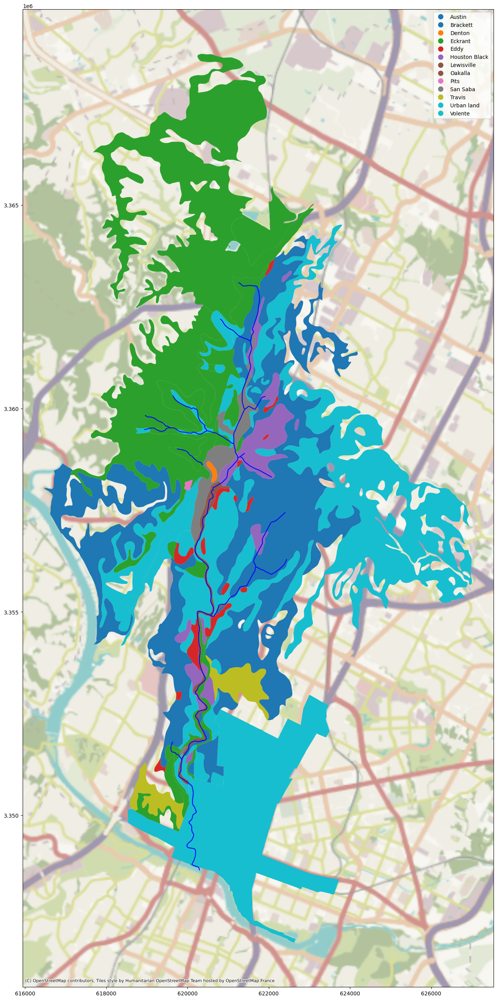

In [31]:
soil_names = soils[soils.intersects(watershed.geometry[0])]  

fig, ax = plt.subplots(figsize=(33, 33))
soil_names.plot(column='soil_name', ax=ax, legend=True)
hydrography.plot(color='blue', ax=ax)
cx.add_basemap(ax, crs=hydrography.crs)

['Very low', 'Low', 'Negligible', 'Medium', 'High', 'Very high']
[0, 1, 2, 3, 4, 5]


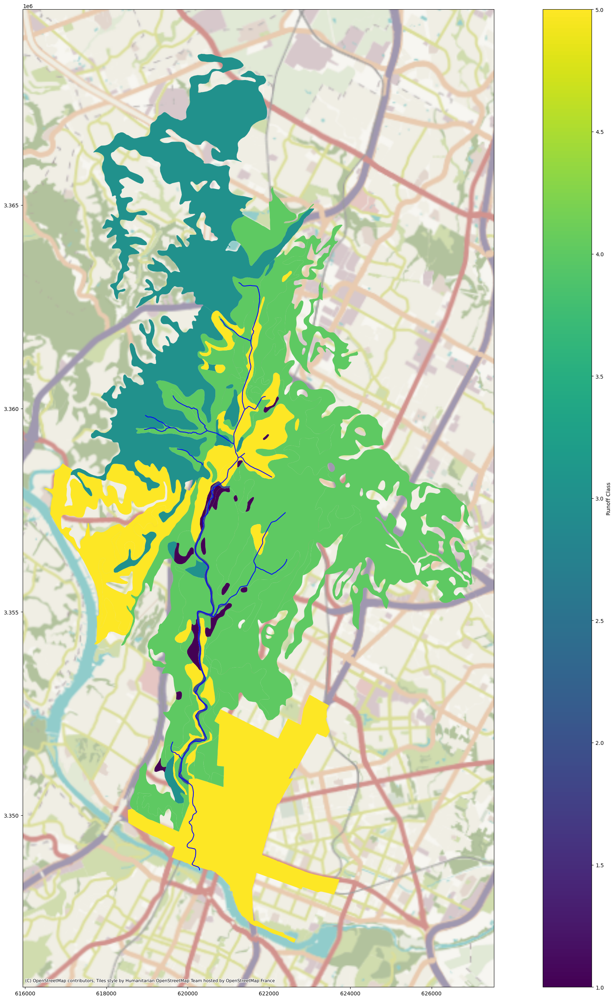

In [32]:
soils_by_runoff = soils[soils["runoff_class"] != " "].loc[soils.intersects(watershed.geometry[0])]

labels = pandas.DataFrame(data=['Very low', 'Low', 'Negligible', 'Medium', 'High', 'Very high'], columns=['x'])

le = LabelEncoder()
le.classes_ = labels['x']

soils_by_runoff['runoff_class_label'] = le.transform(soils_by_runoff['runoff_class'])
legend_labels = dict(zip(le.classes_, range(len(le.classes_))))

print(list(legend_labels.keys()))
print(list(legend_labels.values()))

fig, ax = plt.subplots(figsize=(33, 33))
soils_by_runoff.plot(column='runoff_class_label',
                     ax=ax,
                     legend=True,
                     legend_kwds={'label': 'Runoff Class'})
hydrography.plot(color='blue', ax=ax)
cx.add_basemap(ax, crs=hydrography.crs)

['Not rated', 'Slight', 'Moderate', 'Severe']
[0, 1, 2, 3]


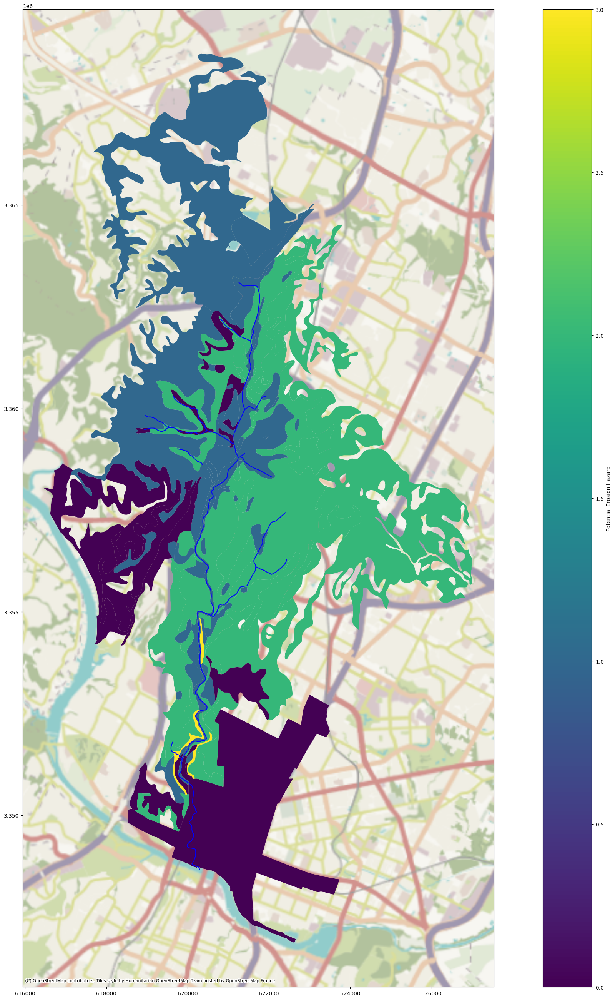

In [33]:
%matplotlib inline

soils_by_runoff = soils[soils["potential_erosion_hazard"] != " "].loc[soils.intersects(watershed.geometry[0])]

labels = pandas.DataFrame(data=['Not rated', 'Slight', 'Moderate', 'Severe'], columns=['x'])

le = LabelEncoder()
le.classes_ = labels['x']

soils_by_runoff['potential_erosion_hazard_label'] = le.transform(soils_by_runoff['potential_erosion_hazard'])
legend_labels = dict(zip(le.classes_, range(len(le.classes_))))

print(list(legend_labels.keys()))
print(list(legend_labels.values()))
fig, ax = plt.subplots(figsize=(33, 33))
soils_by_runoff.plot(column='potential_erosion_hazard_label',
                     ax=ax,
                     legend=True,
                     legend_kwds={'label': 'Potential Erosion Hazard'})
hydrography.plot(color='blue', ax=ax)
cx.add_basemap(ax, crs=hydrography.crs)

['None', 'Rare', 'Occasional', 'Frequent']
[0, 1, 2, 3]


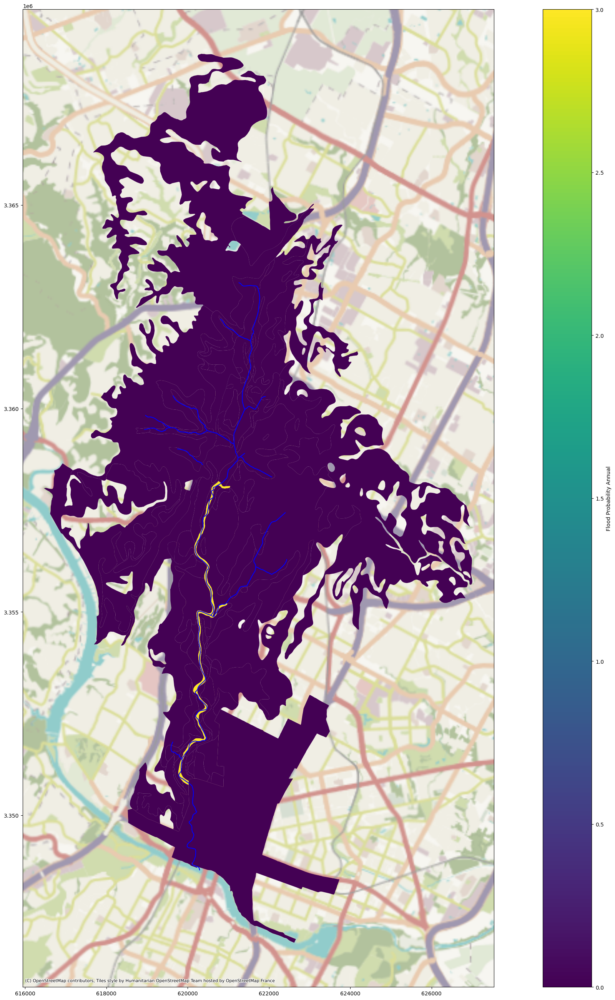

In [34]:
%matplotlib inline

soils_by_runoff = soils[soils["flood_prob_annual"] != " "].loc[soils.intersects(watershed.geometry[0])]

labels = pandas.DataFrame(data=['None', 'Rare', 'Occasional', 'Frequent'], columns=['x'])

le = LabelEncoder()
le.classes_ = labels['x']

soils_by_runoff['flood_prob_annual_label'] = le.transform(soils_by_runoff['flood_prob_annual'])
legend_labels = dict(zip(le.classes_, range(len(le.classes_))))

print(list(legend_labels.keys()))
print(list(legend_labels.values()))
fig, ax = plt.subplots(figsize=(33, 33))
soils_by_runoff.plot(column='flood_prob_annual_label',
                     ax=ax,
                     legend=True,
                     legend_kwds={'label': 'Flood Probability Annual'})
hydrography.plot(color='blue', ax=ax)
cx.add_basemap(ax, crs=hydrography.crs)